In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from scipy import stats
import statsmodels.stats.api as sms
import matplotlib.pyplot as plt
import matplotlib.style as style
import plotly.graph_objects as go
import plotly.express as px
sns.set_theme(style='whitegrid')

In [2]:
# personal computer
df = pd.read_csv("~/Nextcloud/linkedin_recruiter/inputs/model_input.csv", low_memory=False)
# for windows
# df = pd.read_csv("N:/johnson/linkedin_recruiter/inputs/model_input.csv")

In [3]:
df.columns

Index(['country_orig', 'country_dest', 'flow', 'users_orig', 'users_dest',
       'iso3_orig', 'pop_orig', 'gdp_orig', 'hdi_orig', 'iso3_dest',
       'pop_dest', 'gdp_dest', 'hdi_dest', 'query_date', 'region_orig',
       'subregion_orig', 'midregion_orig', 'region_dest', 'subregion_dest',
       'midregion_dest', 'prop_orig', 'prop_dest', 'area_orig', 'area_dest',
       'internet_orig', 'internet_dest', 'eea_orig', 'eu_orig',
       'eurozone_orig', 'schengen_orig', 'eea_dest', 'eu_dest',
       'eurozone_dest', 'schengen_dest', 'dist_biggest_cities',
       'dist_pop_weighted', 'dist_unweighted', 'contig', 'comlang_ethno',
       'colony', 'comcol', 'curcol', 'col45', 'smctry', 'col', 'csl', 'cnl',
       'prox1', 'prox2', 'comp', 'net_flow', 'net_rate_100', 'bin_hdi_orig',
       'bin_hdi_dest', 'bin_gdp_orig', 'bin_gdp_dest'],
      dtype='object')

In [46]:
ID_COLS = ['country_orig', 'country_dest', 'query_date']
DIST_COLS = [x for x in df.columns if 'dist' in x]
BINARY = ['contig', 'comlang_ethno', 'colony', 'comcol', 'curcol', 'col45', 'col']
eu = df.loc[(df['eu_orig'] == 1) & (df['eu_dest'] == 1)]
square_df = df.loc[df['comp'] == 1]
square_eu = df.loc[(df['eu_orig'] == 1) & (df['eu_dest'] == 1) & (df['comp'] == 1)]

### Number of country pairs

In [5]:
def get_num_pairs(df, col_name):
    return df.groupby('query_date')[['iso3_orig', 'iso3_dest']].count().drop(
        'iso3_dest', axis=1).rename(columns={'iso3_orig': col_name})
pd.concat(
    [get_num_pairs(df, 'num pairs'),
    get_num_pairs(square_df, 'num reciprocal pairs'),
    get_num_pairs(eu, 'num EU pairs'),
    get_num_pairs(square_eu, 'num EU reciprocal pairs')], axis=1)

,num pairs,num reciprocal pairs,num EU pairs,num EU reciprocal pairs
query_date,,,,
2020-07-25,4582,1524,339,162
2020-10-08,4520,1450,333,160
2020-10-20,4704,1526,327,160
2020-11-04,4738,1478,313,138
2020-11-19,4694,1474,310,136
2020-12-01,4682,1474,309,134
2020-12-16,4662,1452,315,140
2020-12-31,4599,1422,302,126
2021-01-12,4516,1454,309,140


### Which countries are completely dropped when only keeping the reciprocal pairs?

In [8]:
set(df.country_dest) - set(square_df.country_dest)

{'Iceland', 'Monaco', 'Mongolia', 'Nauru'}

### Which origin countries show up most often?
#### We know only the top 75 origin countries are returned, so check how often certain origin locations appear in the data

In [9]:
df.assign(
    counts=df.groupby(['country_orig', 'query_date'])['country_orig'].transform('count')
).pivot_table('counts', 'country_orig', 'query_date').sort_values(by='2020-07-25', ascending=False).head(20)

query_date,2020-07-25,2020-10-08,2020-10-20,2020-11-04,2020-11-19,2020-12-01,2020-12-16,2020-12-31,2021-01-12,2021-01-27,2021-02-08,2021-02-23
country_orig,,,,,,,,,,,,
United States,172.0,174.0,182.0,185.0,184.0,185.0,184.0,184.0,180.0,185.0,41.0,185.0
United Kingdom,170.0,172.0,179.0,182.0,181.0,182.0,180.0,180.0,176.0,182.0,41.0,182.0
France,167.0,163.0,165.0,170.0,169.0,167.0,167.0,166.0,164.0,167.0,40.0,166.0
India,158.0,157.0,164.0,164.0,161.0,163.0,160.0,160.0,159.0,163.0,41.0,160.0
Canada,141.0,140.0,143.0,144.0,145.0,150.0,142.0,154.0,148.0,157.0,30.0,154.0
Germany,137.0,142.0,147.0,148.0,144.0,138.0,141.0,140.0,137.0,145.0,41.0,146.0
United Arab Emirates,124.0,117.0,120.0,116.0,118.0,118.0,114.0,112.0,108.0,113.0,26.0,113.0
Spain,120.0,115.0,120.0,125.0,122.0,121.0,125.0,121.0,115.0,121.0,33.0,123.0
Italy,107.0,116.0,121.0,122.0,121.0,121.0,121.0,121.0,116.0,119.0,34.0,119.0


### Within the EU:
#### All 27 countries, except Malta & Czech Republic are present at least once in each collection

In [26]:
square_eu.assign(
    counts=square_eu.groupby(['country_orig', 'query_date'])['country_orig'].transform('count')
).pivot_table('counts', 'country_orig', 'query_date').sort_values(by='2020-07-25', ascending=False)

query_date,2020-07-25,2020-10-08,2020-10-20,2020-11-04,2020-11-19,2020-12-01,2020-12-16,2020-12-31,2021-01-12,2021-01-27,2021-02-08,2021-02-23
country_orig,,,,,,,,,,,,
Romania,15.0,14.0,14.0,13.0,13.0,14.0,13.0,12.0,12.0,11.0,10.0,12.0
Poland,12.0,11.0,11.0,8.0,8.0,10.0,9.0,9.0,10.0,9.0,9.0,10.0
France,10.0,10.0,10.0,10.0,10.0,10.0,11.0,9.0,10.0,9.0,9.0,9.0
Spain,10.0,10.0,10.0,10.0,9.0,9.0,10.0,9.0,9.0,9.0,9.0,10.0
Netherlands,10.0,12.0,11.0,10.0,9.0,9.0,9.0,9.0,11.0,10.0,9.0,9.0
Italy,10.0,10.0,10.0,9.0,9.0,9.0,10.0,9.0,9.0,10.0,10.0,9.0
Sweden,9.0,9.0,8.0,9.0,8.0,7.0,7.0,6.0,6.0,8.0,6.0,8.0
Germany,9.0,10.0,9.0,9.0,9.0,8.0,8.0,7.0,10.0,10.0,10.0,9.0
Belgium,8.0,9.0,9.0,9.0,8.0,7.0,9.0,7.0,8.0,7.0,8.0,8.0


## Most frequently appearing origin countries are not also those with the most linkedin users

In [28]:
def compare_top_20(df):
    top_20 = df.assign(
        counts=df.groupby(['country_orig', 'query_date'])['country_orig'].transform('count')
    ).pivot_table('counts', 'country_orig', 'query_date').sort_values(
        by='2020-07-25', ascending=False).head(20).index.values
    top_users = df[['users_orig', 'country_orig']].drop_duplicates(
        subset='country_orig').sort_values(by='users_orig').tail(20)['country_orig']
    print(f'In top 20 origin country, but not most users:\n{set(top_20) - set(top_users)}\n''')
    print(f'In top 20 by number of users, but not in frequency as country of origin:\n{set(top_users) - set(top_20)}')

In [29]:
compare_top_20(df)

In top 20 origin country, but not most users:
{'United Arab Emirates', 'Saudi Arabia', 'Pakistan', 'Malaysia', 'Nigeria', 'Egypt'}

In top 20 by number of users, but not in frequency as country of origin:
{'Argentina', 'Philippines', 'Russia', 'Colombia', 'Mexico', 'Indonesia'}


### Within EU?

In [30]:
compare_top_20(eu)

In top 20 origin country, but not most users:
{'Latvia'}

In top 20 by number of users, but not in frequency as country of origin:
{'Croatia'}


# From here on out, only keep the reciprocal pairs

## Distance

#### missing values?

In [61]:
# nothing missing from EU
square_eu[DIST_COLS].isnull().values.any()

False

In [63]:
# missing values in global dataset
square_df[square_df[DIST_COLS].isnull().any(axis=1)][['country_orig', 'country_dest']].drop_duplicates().sort_values(by='country_orig').reset_index(drop=True)

,country_orig,country_dest
0,Afghanistan,South Sudan
1,Aruba,Curacao
2,Burundi,South Sudan
3,Central African Republic,South Sudan
4,Chad,South Sudan
5,Curacao,Suriname
6,Curacao,Aruba
7,Ethiopia,South Sudan
8,Liberia,South Sudan
9,Sierra Leone,South Sudan


### area is a bit related

In [23]:
def pairplot(df, suffix, name):
    plt.figure(figsize=(10,10))
    g = sns.jointplot(data=square_eu, x=np.log(square_eu[f"area_{suffix}"]), y=np.log(square_eu["flow"]))
    g.set_axis_labels(f'{name} Area (sq km)', 'Flow')
    plt.savefig(f"/Users/scharlottej13/Nextcloud/linkedin_recruiter/outputs/eu_flow_area_{suffix}.png", dpi=300)

<Figure size 720x720 with 0 Axes>

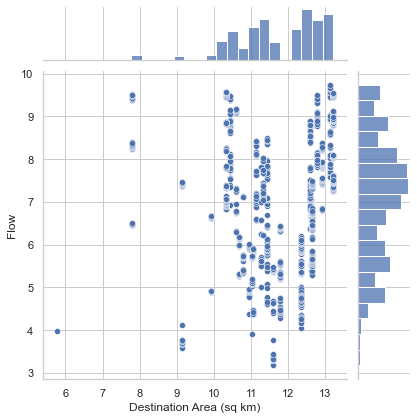

In [25]:
pairplot(square_eu, 'dest', 'Destination')

### does it matter if a country shares a border?

In [105]:
def ttest(df, grp_var, date='2020-10-08'):
    a = df[(df[f'{grp_var}'] == 1) & (df['query_date'] == date)]['flow'].values
    b = df[(df[f'{grp_var}'] == 0) & (df['query_date'] == date)]['flow'].values
    print(f'T test for {grp_var}')
    print(stats.ttest_ind(a, b, equal_var=False))
    cm = sms.CompareMeans(sms.DescrStatsW(a), sms.DescrStatsW(b))
    print(cm.tconfint_diff(usevar='unequal'))

In [106]:
ttest(square_eu, grp_var='contig')

T test for contig
Ttest_indResult(statistic=1.8519716891218478, pvalue=0.06801462610351468)
CI: {cm.tconfint_diff(usevar='unequal')}


In [8]:
px.scatter(
    square_eu, x='gdp', y=np.log(square_eu['flow']),
    hover_data=['country_orig', 'country_dest'],
    size='area_orig',
    title='EU LinkedIn Users Migration Aspirations vs. Area',
    labels={'y': 'Migration Aspirations (log(number))',
            'x': 'Area log(sq km)', 'contig': 'Share Land Border?',
            'country_dest': 'Destination', 'country_orig': 'Origin'}
)

/Users/scharlottej13/anaconda3/envs/linkedin_recruiter/lib/python3.8/site-packages/pandas/core/series.py:4433: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [98]:
square_df['contig'].fillna('Unknown', inplace=True)
px.scatter(
    square_df, x=np.log(square_df['dist_unweighted']), y=np.log(square_df['flow']),
    hover_data=['country_orig', 'country_dest'],
    color='contig',
    title='Global LinkedIn Users Migration Aspirations vs. Distance',
    labels={'y': 'Migration Aspirations (log(number))',
            'x': 'Distance log(pop weighted)',
            'country_dest': 'Destination', 'country_orig': 'Origin'}
)

# Comparison with GWP

In [59]:
# merge w/ gallup
gwp = pd.read_csv("/Users/scharlottej13/Nextcloud/linkedin_recruiter/inputs/GWP/pnmi.csv")
gwp[['PNMI', 'Brain', 'Youth']] = gwp[['PNMI', 'Brain', 'Youth']].apply(
    lambda x: (x.str.strip('%')).astype(float)/100)
gwp.head()

,country,PNMI,Brain,Youth
0,Afghanistan,-0.26,NaN,-0.33
1,Albania,-0.32,-0.50,-0.25
2,Algeria,-0.31,-0.40,-0.44
3,Argentina,-0.02,0.01,-0.08
4,Armenia,0.04,-0.24,0.37


In [70]:
gwp_comp = gwp.merge(
    square_df[['country_orig', 'net_rate_100', 'query_date', 'eu_orig', 'pop_orig', 'users_orig']].drop_duplicates(),
    left_on='country', right_on='country_orig'
)
gwp_comp['eu_orig'] = gwp_comp['eu_orig'].map({1: 'yes', 0: 'no'})
gwp_comp.head()

,country,PNMI,Brain,Youth,country_orig,net_rate_100,query_date,eu_orig,pop_orig,users_orig
0,Afghanistan,-0.26,NaN,-0.33,Afghanistan,0.090383,2020-11-04,no,36296000.0,242303
1,Afghanistan,-0.26,NaN,-0.33,Afghanistan,0.097651,2020-11-19,no,36296000.0,238605
2,Afghanistan,-0.26,NaN,-0.33,Afghanistan,0.150926,2020-10-08,no,36296000.0,237865
3,Afghanistan,-0.26,NaN,-0.33,Afghanistan,0.080586,2020-10-20,no,36296000.0,240736
4,Afghanistan,-0.26,NaN,-0.33,Afghanistan,0.092386,2020-12-01,no,36296000.0,239214


In [65]:
gwp_comp[['PNMI', 'net_rate_100']].describe()
# like orders of magnitude larger?
# b/c of population denominator vs. LinkedIn Users?
# but if you use population as the denominator for LI data then it'd be way to small, right?

,PNMI,net_rate_100
count,11449.000000,11449.000000
mean,0.071432,0.806198
std,0.547284,3.790876
min,-0.700000,-7.809028
25%,-0.240000,-0.450982
50%,-0.110000,-0.077204
75%,0.230000,0.863506
max,2.310000,89.423467


In [62]:
px.scatter(
    gwp_comp, x=np.log(gwp_comp.Youth),
    y=np.log(gwp_comp.net_rate_100),
    hover_data=['country'], color='eu_orig',
    title='Net Migration per 100 (log transformed)',
    labels={'x': 'GWP Youth', 'y': 'LinkedIn'}
)

/Users/scharlottej13/anaconda3/envs/linkedin_recruiter/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning:

divide by zero encountered in log

/Users/scharlottej13/anaconda3/envs/linkedin_recruiter/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning:

invalid value encountered in log



In [75]:
fig = px.scatter(
    gwp_comp, x=np.log(gwp_comp.PNMI),
    y=np.log(gwp_comp.net_rate_100),
    hover_data=['country'], color=np.log(gwp_comp['users_orig']),
    title='Net Migration per 100 (log transformed)',
    labels={'x': 'GWP PNMI', 'y': 'LinkedIn'}
)
fig.update_xaxes(range=[-8.2,4.5])
fig.update_yaxes(range=[-8.2,4.5])
# fig.add_shape(type="line",
#     x0=4, y0=0, x1=6, y1=2,
#     line=dict(
#         color="MediumPurple",
#         width=4,
#         dash="dot"))
fig.show()

In [63]:
px.scatter(
    gwp_comp, x='Youth', y='net_rate_100',
    hover_data=['country'], color='eu_orig',
    title='Net Migration per 100',
    labels={'Youth': 'GWP Youth', 'net_rate_100': 'LinkedIn'})